In [131]:
## Boiler plate code common to many notebooks.  See the TestFilesCommonCode.ipynb for details
from __future__ import print_function
%run TestFilesCommonCode.ipynb

SimpleITK Version: 0.9.1
Compiled: Sep 28 2015 10:07:41



In [132]:
import scipy.io

In [133]:
OUT_DIR='/raid0/homes/aghayoor/Desktop/phantom'

In [148]:
t1=sitk.Image(256,256,sitk.sitkUInt8)
t2=sitk.Image(256,256,sitk.sitkUInt8)

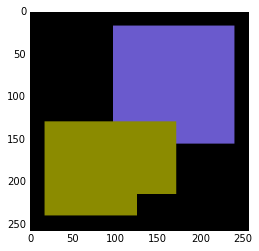

In [149]:
# create modality 1
#
t1_arr=sitk.GetArrayFromImage(t1)
t1_arr[17:129,97:239]=50 # tissue A or c
t1_arr[129:155,171:239]=50 # tissue A or C
t1_arr[129:239,17:171]=250 # tissue B
t1_arr[214:255,125:255]=0
#
t1=sitk.GetImageFromArray(t1_arr)
myshow(sitk.LabelToRGB(t1))

In [150]:
sitk.WriteImage(t1,os.path.join(OUT_DIR,'t1.nii.gz'))
scipy.io.savemat(os.path.join(OUT_DIR,'t1.mat'), mdict={'t1': t1_arr})

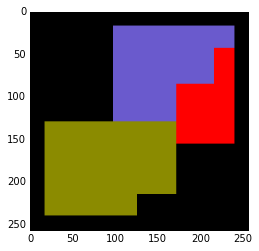

In [151]:
# create modality 2
#
t2_arr=sitk.GetArrayFromImage(t2)
t2_arr[17:129,97:239]=200 # tissue A
t2_arr[129:239,17:171]=100 # tissue B
t2_arr[214:255,125:255]=0
t2_arr[43:129,171:239]=150 # tissue C
t2_arr[129:155,171:239]=150 # tissue C
t2_arr[43:85,171:215]=200 # tissue A
#
#
t2=sitk.GetImageFromArray(t2_arr)
myshow(sitk.LabelToRGB(t2))

In [152]:
sitk.WriteImage(t2,os.path.join(OUT_DIR,'t2.nii.gz'))
scipy.io.savemat(os.path.join(OUT_DIR,'t2.mat'), mdict={'t2': t2_arr})

(17, 17)
(15.0, 15.0)


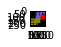

In [153]:
t2_lr = sitk.Shrink(t2,[15,15])
myshow(sitk.LabelToRGB(t2_lr))

print(t2_lr.GetSize())
print(t2_lr.GetSpacing())

In [154]:
sitk.WriteImage(t2_lr,os.path.join(OUT_DIR,'t2_lr.nii.gz'))

t2_lr_arr=sitk.GetArrayFromImage(t2_lr)
scipy.io.savemat(os.path.join(OUT_DIR,'t2_lr.mat'), mdict={'t2_lr': t2_lr_arr})

In [155]:
# compute pure plugs mask
#
#
#

In [156]:
#t2_lr=t2

In [157]:
purePlugsMask = sitk.Image(t2_lr.GetSize(),sitk.sitkUInt8)
purePlugsMask.CopyInformation(t2_lr)
#print(purePlugsMask)

In [158]:
def isPurePlug(idx, t2_lr, t1):
    # high spacing (low resolution)
    hspc=np.array(t2_lr.GetSpacing())
    # low spacing (high resolution)
    lspc=np.array(t1.GetSpacing())

    factor=hspc/lspc
    #print("factor: {0}".format(factor))
    stepSize=1/factor
    #print("step_size: {0}".format(stepSize))

    hResSize = t1.GetSize()
    
    # continues index
    cidx=np.array([float(i) for i in idx])
    print('----------------------------')
    print("index: {0}".format(cidx)) # <-----
    p = t2_lr.TransformContinuousIndexToPhysicalPoint(cidx)
    print(p)
    #
    isInside = True
    t1_sampleValues=[]
    for iss in np.arange(cidx[0]-1.0/2+stepSize[0]/2,cidx[0]+1.0/2,stepSize[0]):
        for jss in np.arange(cidx[1]-1.0/2+stepSize[1]/2,cidx[1]+1.0/2,stepSize[1]):
            cssidx=[iss, jss]
            #
            print("continus subsample: {0}".format(cssidx)) # <-----
            #
            p = t2_lr.TransformContinuousIndexToPhysicalPoint(cssidx)
            #
            print("point: {0}".format(p)) # <-----
            #
            newidx = t1.TransformPhysicalPointToIndex(p)
            #
            print("newidx: {0}".format(newidx)) # <-----
            #
            if any( newidx[i] < 0 or newidx[i] >= hResSize[i] for i in range(len(newidx))):
                isInside = False
                #
                print("is not inside") # <-----
                #
                break
            else:
                #print("yes!")
                t1_value = t1[newidx]
                t1_sampleValues.append(t1_value)
        else:
            continue
        break

    ispure = False
    if isInside:
        #
        print("sample values: ") # <-----
        print(t1_sampleValues) # <-----
        #
        t1_arr = np.array(t1_sampleValues)
        # First check to see wether the variance is zero
        # In this case, surely we have a pure plug
        var_t1 = np.var(t1_arr)
        #
        #print("var: {0}".format(var_t1)) # <-----
        #print("det cov: {0}".format(np.linalg.det(cov_t1t2))) # <-----
        #
        if var_t1 == 0: # it means that the std in at least one image is zero 
            ispure = True
        else:
            ispure = False
    #
    print("Is pure: {0}".format(ispure)) # <-----
    #
    return ispure

In [159]:
t2_lr_size = t2_lr.GetSize()

for i in range(0,t2_lr_size[0]):
  for j in range(0,t2_lr_size[1]):
      idx=[i,j]
      if( isPurePlug(idx,t2_lr,t1) ):
        purePlugsMask[idx] = 1
      else:
        purePlugsMask[idx] = 0

----------------------------
index: [ 0.  0.]
(7.5, 7.5)
continus subsample: [-0.46666666666666667, -0.46666666666666667]
point: (0.5, 0.5)
newidx: (1L, 1L)
continus subsample: [-0.46666666666666667, -0.40000000000000002]
point: (0.5, 1.5)
newidx: (1L, 2L)
continus subsample: [-0.46666666666666667, -0.33333333333333337]
point: (0.5, 2.499999999999999)
newidx: (1L, 2L)
continus subsample: [-0.46666666666666667, -0.26666666666666672]
point: (0.5, 3.499999999999999)
newidx: (1L, 3L)
continus subsample: [-0.46666666666666667, -0.20000000000000007]
point: (0.5, 4.499999999999999)
newidx: (1L, 4L)
continus subsample: [-0.46666666666666667, -0.13333333333333341]
point: (0.5, 5.499999999999998)
newidx: (1L, 5L)
continus subsample: [-0.46666666666666667, -0.066666666666666763]
point: (0.5, 6.499999999999998)
newidx: (1L, 6L)
continus subsample: [-0.46666666666666667, -1.1102230246251565e-16]
point: (0.5, 7.499999999999998)
newidx: (1L, 7L)
continus subsample: [-0.46666666666666667, 0.0666666666

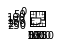

In [160]:
myshow(purePlugsMask)
sitk.WriteImage(purePlugsMask,os.path.join(OUT_DIR,'pureplugs_mask.nii.gz'))